In [ ]:
# Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Installer toutes les bibliothèques nécessaires
!pip install --quiet torch torchvision torchaudio --upgrade
!pip install --quiet timm
!pip install --quiet torchmetrics
!pip install --quiet albumentations
!pip install --quiet scikit-learn
!pip install --quiet matplotlib
!pip install --quiet tqdm
!pip install --quiet ipytest
!pip install --quiet opencv-python-headless

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.7/899.7 MB 862.0 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 594.3/594.3 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 140.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 MB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 954.8/954.8 kB 58.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 62.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.6/63.6 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.5/267.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.2/288.2 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.3/39.3 MB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.0/90.0 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170

In [ ]:
# Copier le dataset depuis Google Drive vers le stockage local de Colab
!cp -r /content/drive/MyDrive/data/PlantVillage_Tomato /content/

In [ ]:
# Copier le dataset depuis Google Drive vers le stockage local de Colab
!cp -r /content/drive/MyDrive/data/PlantDoc_Tomato /content/

In [ ]:
# Copier le dataset depuis Google Drive vers le stockage local de Colab
!cp -r /content/drive/MyDrive/data/test_dataset_final /content/

In [ ]:
# Importation des modules et configuration
import os
import cv2
import torch
import numpy as np
import random
from torch.utils.data import DataLoader, Dataset, Subset, WeightedRandomSampler
from torchvision import datasets
import albumentations as A
from albumentations.pytorch import ToTensorV2
from google.colab import drive

class Config:
    DATA_PATH = "/content/PlantVillage_Tomato"
    BATCH_SIZE = 32
    SEED = 42
#  Fixer les seeds pour la reproductibilité
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

set_seed(Config.SEED)
# Entraînement complet pour trois modéle MobileNetV3_Small , MobileNetV2 et MobileNetV2 avec attention



In [ ]:
# Définition des classes du dataset
CLASSES = [
    "Tomato_Early_Blight",
    "Tomato_Late_Blight",
    "Tomato_Leaf_Mold",
    "Tomato_Septoria_leaf_spot",
    "Tomato_Bacterial_Spot",
    "Tomato_mosaic_virus",
    "Tomato_Yellow_Leaf_Curl_Virus",
    "Tomato_Healthy"
]


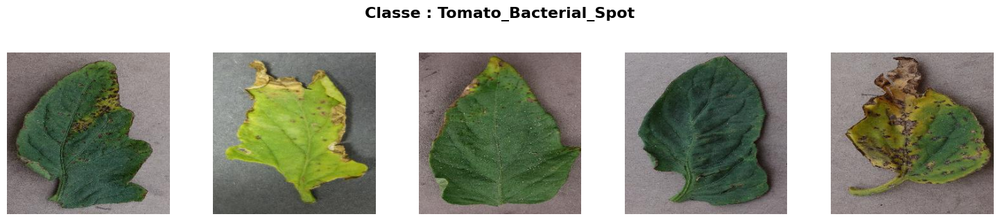

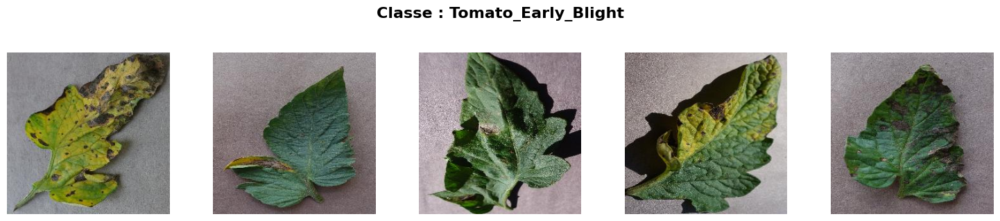

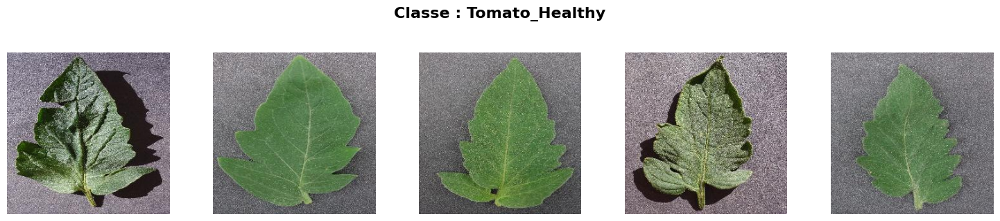

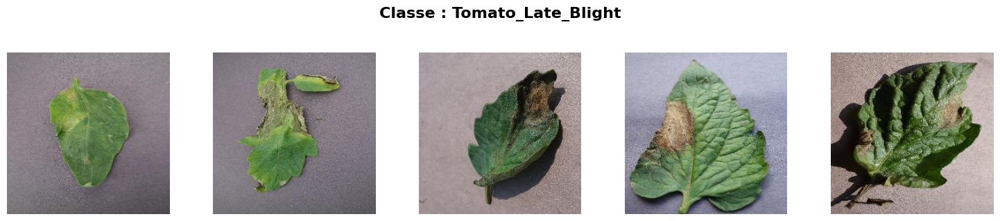

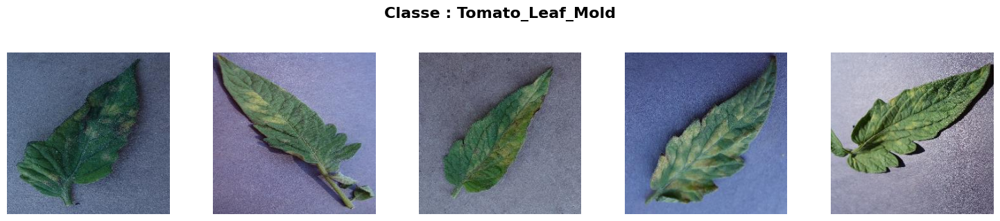

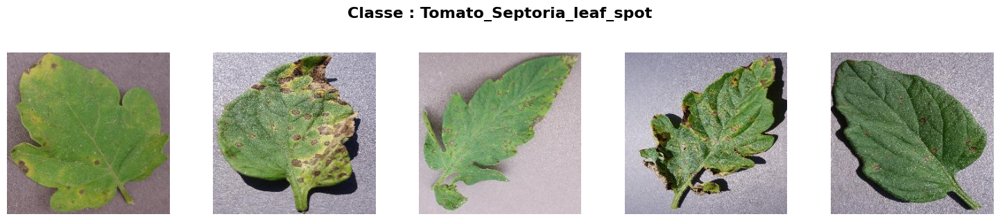

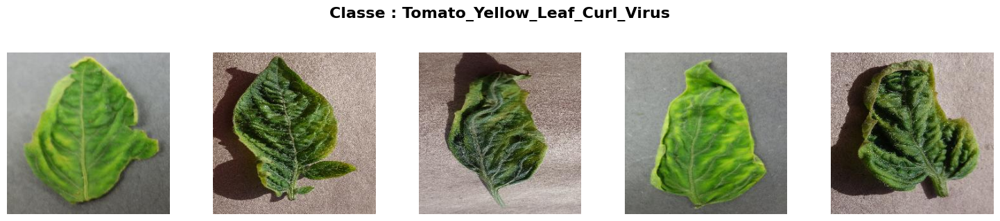

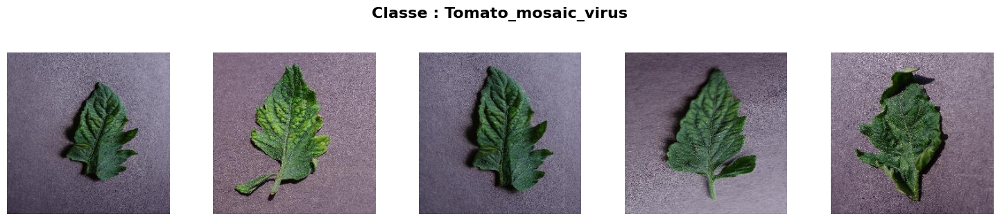

In [ ]:
# Affiche quelques images de chaque classe.


import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_dataset_samples(data_path, samples_per_class=5):



    classes = sorted([
        d for d in os.listdir(data_path)
        if os.path.isdir(os.path.join(data_path, d))
    ])


    for cls in classes:
        cls_path = os.path.join(data_path, cls)


        images = [
            f for f in os.listdir(cls_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ]


        if len(images) == 0:
            continue


        n_samples = min(samples_per_class, len(images))
        sample_images = random.sample(images, n_samples)


        fig, axes = plt.subplots(1, samples_per_class, figsize=(15, 3))


        fig.suptitle(
            f"Classe : {cls}",
            fontsize=16,
            fontweight='bold',
            y=1.05
        )

        for i in range(samples_per_class):
            ax = axes[i]

            if i < n_samples:
                img_path = os.path.join(cls_path, sample_images[i])
                img = Image.open(img_path)
                ax.imshow(img)


            ax.axis('off')

        plt.tight_layout()
        plt.show()



dataset_path = "/content/PlantVillage_Tomato"
visualize_dataset_samples(dataset_path)


In [ ]:
# Augmentations, dataset et gestion des données

class AugmentationStrategy:
    """
    Cette classe sert à modifier le fond des images.
    """

    @staticmethod
    def inject_background(image_np):

        hsv = cv2.cvtColor(image_np, cv2.COLOR_RGB2HSV)


        mask = cv2.inRange(hsv, (20, 30, 30), (95, 255, 255))


        bg_noise = np.zeros_like(image_np)
        bg_noise[:, :, 1] = np.random.randint(
            40, 90, (image_np.shape[0], image_np.shape[1])
        )
        bg_noise[:, :, 0] = np.random.randint(
            10, 50, (image_np.shape[0], image_np.shape[1])
        )


        leaf_only = cv2.bitwise_and(image_np, image_np, mask=mask)


        bg_only = cv2.bitwise_and(
            bg_noise, bg_noise, mask=cv2.bitwise_not(mask)
        )


        return cv2.add(leaf_only, bg_only)


# AUGMENTATIONS POUR TRAIN / VAL

class AugmentationFactory:

    @staticmethod
    def get_train_aug():
        return A.Compose([
            A.Rotate(limit=35, p=0.5),          # Rotation aléatoire
            A.HorizontalFlip(p=0.5),            # Flip horizontal
            A.VerticalFlip(p=0.2),              # Flip vertical
            A.RandomBrightnessContrast(p=0.2),  # Changement de luminosité
            A.Resize(224, 224),                 # Redimensionnement
            A.Normalize(
                mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)
            ),
            ToTensorV2()
        ])

    @staticmethod
    def get_val_aug():
        return A.Compose([
            A.Resize(224, 224),
            A.Normalize(
                mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)
            ),
            ToTensorV2()
        ])



# CLASS DATASET PERSONNALISÉ

class PlantDataset(Dataset):


    def __init__(self, subset, transform=None, use_injection=False):
        self.subset = subset
        self.transform = transform
        self.use_injection = use_injection

    def __getitem__(self, i):
        # Récupération de l'image et du label
        img, lbl = self.subset[i]

        # Conversion PIL vers NumPy
        img_np = np.array(img)

        # Modification du fond (seulement pour l'entraînement)
        if self.use_injection and random.random() > 0.4:
            img_np = AugmentationStrategy.inject_background(img_np)

        # Application des transformations
        if self.transform:
            img_np = self.transform(image=img_np)["image"]

        return img_np, lbl

    def __len__(self):
        return len(self.subset)



# prépare les DataLoaders train validation et test

class DataManager:


    def __init__(self, data_path):

        full_ds = datasets.ImageFolder(data_path)

        self.classes = full_ds.classes
        self.num_classes = len(self.classes)


        indices = torch.randperm(len(full_ds))


        train_end = int(0.8 * len(full_ds))
        val_end = int(0.9 * len(full_ds))

        self.train_idx = indices[:train_end]
        self.val_idx = indices[train_end:val_end]
        self.test_idx = indices[val_end:]


        self.train_labels = [full_ds.targets[i] for i in self.train_idx]


        self.sampler = self._create_weighted_sampler()

        # Création des datasets
        self.train_ds = PlantDataset(
            Subset(full_ds, self.train_idx),
            AugmentationFactory.get_train_aug(),
            use_injection=True
        )

        self.val_ds = PlantDataset(
            Subset(full_ds, self.val_idx),
            AugmentationFactory.get_val_aug()
        )

        self.test_ds = PlantDataset(
            Subset(full_ds, self.test_idx),
            AugmentationFactory.get_val_aug()
        )

    def _create_weighted_sampler(self):

        counts = np.bincount(self.train_labels)


        weights = 1.0 / (counts + 1e-6)


        sample_weights = torch.tensor([weights[t] for t in self.train_labels])

        return WeightedRandomSampler(sample_weights, len(sample_weights))

    def get_loaders(self):
        # Création des DataLoaders
        train_loader = DataLoader(
            self.train_ds,
            batch_size=Config.BATCH_SIZE,
            sampler=self.sampler,
            num_workers=0
        )

        val_loader = DataLoader(
            self.val_ds,
            batch_size=Config.BATCH_SIZE,
            shuffle=False,
            num_workers=0
        )

        test_loader = DataLoader(
            self.test_ds,
            batch_size=Config.BATCH_SIZE,
            shuffle=False,
            num_workers=0
        )

        # Affichage des informations
        print(f"Classes trouvées : {len(self.classes)}")
        print(
            f"Train: {len(self.train_ds)} | "
            f"Val: {len(self.val_ds)} | "
            f"Test: {len(self.test_ds)}"
        )

        return train_loader, val_loader, test_loader


In [ ]:
# Exécution et création des DataLoaders
manager = DataManager(Config.DATA_PATH)
train_loader, val_loader, test_loader = manager.get_loaders()
num_classes = len(manager.classes)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Classes trouvées : 8
Train: 12064 | Val: 1508 | Test: 1508


In [ ]:
# Configuration des tests avec ipytest
import ipytest
import pytest


ipytest.autoconfig()

In [ ]:
%%ipytest
# Test unitaire pour l’injection du fond
import numpy as np

def test_background_injection_shape():
    sample_img = np.random.randint(0, 255, (256, 256, 3), dtype=np.uint8)
    injected_img = AugmentationStrategy.inject_background(sample_img)

    # Vérifie que la forme reste identique
    assert injected_img.shape == sample_img.shape

    # Vérifie que l'image a changé après l'injection
    assert not np.array_equal(sample_img, injected_img)


.                                                                                            [100%]
1 passed in 0.02s


In [ ]:
%%ipytest
# Test du data split
def test_data_manager_splits():

    total_len = len(manager.train_idx) + len(manager.val_idx) + len(manager.test_idx)


    assert len(manager.train_ds) == len(manager.train_idx)
    assert len(manager.val_ds) == len(manager.val_idx)
    print(f"Verified {total_len} total images split correctly.")

.                                                                                            [100%]
1 passed in 0.01s


In [ ]:
%%ipytest
# vérifier que les images après augmentation sont des tenseurs PyTorch

def test_augmentation_output_specs():

    img, lbl = manager.train_ds[0]

    assert torch.is_tensor(img)
    assert img.shape == (3, 224, 224)

.                                                                                            [100%]
1 passed in 0.02s


In [ ]:
%%ipytest
# Test du WeightedRandomSampler
def test_weighted_sampler_logic():

    weights = manager.sampler.weights
    assert len(weights) == len(manager.train_idx)
    assert torch.min(weights) > 0, "Sampler found a class with 0 weight!"

.                                                                                            [100%]
1 passed in 0.04s


In [ ]:
import os
MODEL_SAVE_PATH = "/content/drive/MyDrive/modelV7"
os.makedirs(MODEL_SAVE_PATH, exist_ok=True)


In [ ]:
#Définition du modèle et trainer

import torch
import torch.nn as nn
import torch.optim as optim
import timm
from tqdm.auto import tqdm



# Bloc attention pour améliorer MobileNetV2
class SqueezeExcitation(nn.Module):
    def __init__(self, input_channels, reduction=16):
        super().__init__()
        self.squeeze = nn.AdaptiveAvgPool2d(1)
        self.excitation = nn.Sequential(
            nn.Linear(input_channels, input_channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(input_channels // reduction, input_channels, bias=False),
            nn.Sigmoid()
        )
    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.squeeze(x).view(b, c)
        y = self.excitation(y).view(b, c, 1, 1)
        return x * y
# MobileNetV2 avec attention
class AttentiveMobileNetV2(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.backbone = timm.create_model('mobilenetv2_100', pretrained=True, num_classes=0, global_pool='')


        self.attention = SqueezeExcitation(1280)
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Linear(1280, num_classes)

    def forward(self, x):

        x = self.backbone(x)
        x = self.attention(x)
        x = self.global_pool(x)
        x = torch.flatten(x, 1)
        return self.classifier(x)
#  Classe Trainer pour gérer l'entraînement et la validation
class Trainer:
    def __init__(self, model, model_name, device):
        self.model = model.to(device)
        self.model_name = model_name
        self.device = device
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=0.0005)

    def train_one_epoch(self, loader):
        self.model.train()
        running_loss = 0.0
        pbar = tqdm(loader, unit="batch", desc=f"Training {self.model_name}")
        for images, labels in pbar:
            images, labels = images.to(self.device), labels.to(self.device)
            self.optimizer.zero_grad()
            outputs = self.model(images)
            loss = self.criterion(outputs, labels)
            loss.backward()
            self.optimizer.step()
            running_loss += loss.item()
            pbar.set_postfix(loss=f"{loss.item():.4f}")
        return running_loss / len(loader)

    def validate(self, loader):
        self.model.eval()
        running_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            for images, labels in loader:
                images, labels = images.to(self.device), labels.to(self.device)
                outputs = self.model(images)
                loss = self.criterion(outputs, labels)
                running_loss += loss.item()

                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        accuracy = 100 * correct / total
        avg_loss = running_loss / len(loader)
        return avg_loss, accuracy

    def save_model(self, path):
        full_path = os.path.join(path, f"{self.model_name}.pth")
        torch.save(self.model.state_dict(), full_path)
        print(f"--- Saved: {full_path} ---")
# Arrête l'entraînement si la précision de validation n'améliore pas
class EarlyStopping:

    def __init__(self, patience=3, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_score = None
        self.early_stop = False

    def __call__(self, val_acc):
        if self.best_score is None:
            self.best_score = val_acc
            return False

        if val_acc - self.best_score > self.min_delta:
            self.best_score = val_acc
            self.counter = 0
            return False
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
            return self.early_stop


In [ ]:
%%ipytest -vx
#Vérifie que le bloc SE :ne change pas la taille spatiale de l’entrée modifie bien les valeurs (recalibration)
def test_squeeze_excitation_logic():

    batch, channels, height, width = 2, 1280, 7, 7
    se_block = SqueezeExcitation(input_channels=channels, reduction=16)
    dummy_input = torch.randn(batch, channels, height, width)

    output = se_block(dummy_input)

    assert output.shape == dummy_input.shape
    assert not torch.equal(output, dummy_input)
# Vérifie que le modèle complet AttentiveMobileNetV2 : produit des logits avec le nombre correct de classes
def test_attentive_model_forward_pass():
    """Verify the full attentive model outputs correct class logits."""
    num_classes = 8
    model = AttentiveMobileNetV2(num_classes=num_classes)
    dummy_input = torch.randn(1, 3, 224, 224)

    output = model(dummy_input)

    assert output.shape == (1, num_classes), f"Expected (1, 8), got {output.shape}"

======================================= test session starts ========================================
platform linux -- Python 3.12.12, pytest-8.4.2, pluggy-1.6.0
rootdir: /content
plugins: typeguard-4.4.4, langsmith-0.4.59, anyio-4.12.0
collected 2 items

t_857cc3d3938e49b3a211444b6f002cc5.py ..                                                     [100%]

======================================== 2 passed in 0.52s =========================================


In [ ]:
%%ipytest -vx
# Test du mécanisme de sauvegarde du modèle
def test_model_saving_logic(tmp_path):

    model = AttentiveMobileNetV2(num_classes=8)
    trainer = Trainer(model, "TestSave", torch.device("cpu"))


    trainer.save_model(tmp_path)

    save_file = tmp_path / "TestSave.pth"
    assert save_file.exists()

======================================= test session starts ========================================
platform linux -- Python 3.12.12, pytest-8.4.2, pluggy-1.6.0
rootdir: /content
plugins: typeguard-4.4.4, langsmith-0.4.59, anyio-4.12.0
collected 1 item

t_857cc3d3938e49b3a211444b6f002cc5.py .                                                      [100%]

======================================== 1 passed in 0.31s =========================================


In [ ]:
# Entraînement complet pour trois modéle MobileNetV3_Small , MobileNetV2 et MobileNetV2 avec attention

models_to_train = [
    ("MobileNetV3_Small", timm.create_model('mobilenetv3_small_100', pretrained=True, num_classes=num_classes)),
    ("MobileNetV2_Standard", timm.create_model('mobilenetv2_100', pretrained=True, num_classes=num_classes)),
    ("MobileNetV2_Attentive", AttentiveMobileNetV2(num_classes=num_classes))
]

for name, architecture in models_to_train:

    trainer = Trainer(architecture, name, DEVICE)

    best_val_acc = 0.0
    early_stopper = EarlyStopping(patience=3, min_delta=0.01)

    for epoch in range(50):
        # Entraînement pour une epoch
        avg_train_loss = trainer.train_one_epoch(train_loader)

        # Validation
        avg_val_loss, val_acc = trainer.validate(val_loader)
        # Affichage des résultats
        print(f"Epoch [{epoch+1}] | Train Loss: {avg_train_loss:.4f} | "
              f"Val Loss: {avg_val_loss:.4f} | Val Acc: {val_acc:.2f}%")

        # Sauvegarde du meilleur modèle
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            trainer.save_model(MODEL_SAVE_PATH)

        # Vérifie l’early stopping
        if early_stopper(val_acc):
            print(f"Early stopping triggered at epoch {epoch+1}")
            break


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/10.2M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/14.2M [00:00<?, ?B/s]

Training MobileNetV3_Small:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [1] | Train Loss: 0.5764 | Val Loss: 0.5065 | Val Acc: 84.55%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV3_Small.pth ---


Training MobileNetV3_Small:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [2] | Train Loss: 0.2584 | Val Loss: 0.2659 | Val Acc: 93.83%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV3_Small.pth ---


Training MobileNetV3_Small:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [3] | Train Loss: 0.1810 | Val Loss: 0.1630 | Val Acc: 95.62%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV3_Small.pth ---


Training MobileNetV3_Small:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [4] | Train Loss: 0.1731 | Val Loss: 0.1822 | Val Acc: 94.10%


Training MobileNetV3_Small:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [5] | Train Loss: 0.1328 | Val Loss: 0.1956 | Val Acc: 95.16%


Training MobileNetV3_Small:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [6] | Train Loss: 0.1535 | Val Loss: 0.2289 | Val Acc: 92.90%
Early stopping triggered at epoch 6


Training MobileNetV2_Standard:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [1] | Train Loss: 0.3824 | Val Loss: 0.1681 | Val Acc: 94.50%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Standard.pth ---


Training MobileNetV2_Standard:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [2] | Train Loss: 0.1449 | Val Loss: 0.0652 | Val Acc: 98.21%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Standard.pth ---


Training MobileNetV2_Standard:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [3] | Train Loss: 0.1081 | Val Loss: 0.0476 | Val Acc: 98.41%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Standard.pth ---


Training MobileNetV2_Standard:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [4] | Train Loss: 0.0894 | Val Loss: 0.0472 | Val Acc: 98.74%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Standard.pth ---


Training MobileNetV2_Standard:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [5] | Train Loss: 0.0737 | Val Loss: 0.0595 | Val Acc: 98.28%


Training MobileNetV2_Standard:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [6] | Train Loss: 0.0768 | Val Loss: 0.0526 | Val Acc: 98.74%


Training MobileNetV2_Standard:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [7] | Train Loss: 0.0675 | Val Loss: 0.0438 | Val Acc: 98.74%
Early stopping triggered at epoch 7


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [1] | Train Loss: 0.3333 | Val Loss: 0.0717 | Val Acc: 97.88%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Attentive.pth ---


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [2] | Train Loss: 0.1187 | Val Loss: 0.0537 | Val Acc: 98.21%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Attentive.pth ---


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [3] | Train Loss: 0.0998 | Val Loss: 0.0642 | Val Acc: 98.08%


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [4] | Train Loss: 0.0841 | Val Loss: 0.0480 | Val Acc: 98.74%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Attentive.pth ---


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [5] | Train Loss: 0.0706 | Val Loss: 0.0493 | Val Acc: 98.81%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Attentive.pth ---


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [6] | Train Loss: 0.0609 | Val Loss: 0.0328 | Val Acc: 99.34%
--- Saved: /content/drive/MyDrive/modelV7/MobileNetV2_Attentive.pth ---


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [7] | Train Loss: 0.0456 | Val Loss: 0.1015 | Val Acc: 97.68%


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [8] | Train Loss: 0.0460 | Val Loss: 0.0327 | Val Acc: 99.07%


Training MobileNetV2_Attentive:   0%|          | 0/377 [00:00<?, ?batch/s]

Epoch [9] | Train Loss: 0.0529 | Val Loss: 0.0439 | Val Acc: 99.01%
Early stopping triggered at epoch 9


In [ ]:
# Classe pour l’évaluation finale des modèles
import pandas as pd
import torch
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, confusion_matrix, classification_report
)
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

class ModelEvaluator:
    def __init__(self, models_to_evaluate, test_loader, device, class_names, save_path):

        self.models = models_to_evaluate
        self.test_loader = test_loader
        self.device = device
        self.class_names = class_names
        self.save_path = save_path
        self.results_summary = []

    def load_weights(self):

        for name, model in self.models:
            weight_path = os.path.join(self.save_path, f"{name}.pth")
            if os.path.exists(weight_path):
                model.load_state_dict(torch.load(weight_path, map_location=self.device))
                print(f"Successfully loaded weights for {name}")
            else:
                print(f"Warning: Weights for {name} not found at {weight_path}")

    def run_evaluation(self):

        for name, model in self.models:
            model.to(self.device)
            model.eval()

            all_preds = []
            all_labels = []

            with torch.no_grad():
                for images, labels in tqdm(self.test_loader, desc=f"Evaluating {name}"):
                    images = images.to(self.device)
                    outputs = model(images)
                    preds = torch.argmax(outputs, dim=1)

                    all_preds.extend(preds.cpu().numpy())
                    all_labels.extend(labels.numpy())

            self._calculate_metrics(name, all_labels, all_preds)
            self._plot_confusion_matrix(name, all_labels, all_preds)

    def _calculate_metrics(self, name, y_true, y_pred):

        acc = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, average='weighted')
        rec = recall_score(y_true, y_pred, average='weighted')
        f1 = f1_score(y_true, y_pred, average='weighted')

        self.results_summary.append({
            "Model": name,
            "Accuracy": acc,
            "Precision": prec,
            "Recall": rec,
            "F1-Score": f1
        })

        print(f"\n--- Detailed Classification Report for {name} ---")
        print(classification_report(y_true, y_pred, target_names=self.class_names))

    def _plot_confusion_matrix(self, name, y_true, y_pred):

        cm = confusion_matrix(y_true, y_pred)
        plt.figure(figsize=(12, 9))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=self.class_names, yticklabels=self.class_names)
        plt.title(f"Confusion Matrix: {name}")
        plt.ylabel('Actual Label')
        plt.xlabel('Predicted Label')
        plt.show()

    def display_summary_table(self):

        df = pd.DataFrame(self.results_summary)
        print("\n" + "="*50)
        print("FINAL COMPARATIVE ANALYSIS")
        print("="*50)
        display(df)
        return df



In [ ]:
%%ipytest -vx

def test_metrics_calculation_logic():
    """Verify if _calculate_metrics correctly populates the results list."""
    # Setup dummy data
    evaluator = ModelEvaluator([], None, "cpu", ["A", "B"], "")
    y_true = [0, 1, 0, 1]
    y_pred = [0, 0, 0, 1] # 75% accuracy

    evaluator._calculate_metrics("TestModel", y_true, y_pred)

    result = evaluator.results_summary[0]
    assert result["Model"] == "TestModel"
    assert result["Accuracy"] == 0.75
    assert "F1-Score" in result
    print("✅ Metrics calculation logic verified.")


def test_summary_table_generation():
    """Check if the results summary can be converted to a DataFrame."""
    evaluator = ModelEvaluator([], None, "cpu", [], "")
    evaluator.results_summary = [
        {"Model": "M1", "Accuracy": 0.9},
        {"Model": "M2", "Accuracy": 0.8}
    ]
    df = evaluator.display_summary_table()

    assert len(df) == 2
    assert list(df.columns) == ["Model", "Accuracy"]
    print("✅ Summary table generation verified.")

======================================= test session starts ========================================
platform linux -- Python 3.12.12, pytest-8.4.2, pluggy-1.6.0
rootdir: /content
plugins: typeguard-4.4.4, langsmith-0.4.59, anyio-4.12.0
collected 2 items

t_857cc3d3938e49b3a211444b6f002cc5.py .

,Model,Accuracy
0,M1,0.9
1,M2,0.8


.                                                     [100%]

======================================== 2 passed in 0.06s =========================================


======================================================

Successfully loaded weights for MobileNetV3_Small
Successfully loaded weights for MobileNetV2_Standard
Successfully loaded weights for MobileNetV2_Attentive


Evaluating MobileNetV3_Small:   0%|          | 0/48 [00:00<?, ?it/s]


--- Detailed Classification Report for MobileNetV3_Small ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.89      0.96      0.92       217
          Tomato_Early_Blight       0.92      0.76      0.83       100
               Tomato_Healthy       1.00      0.99      1.00       167
           Tomato_Late_Blight       0.97      0.93      0.95       183
             Tomato_Leaf_Mold       0.96      0.87      0.92        93
    Tomato_Septoria_leaf_spot       0.90      0.97      0.93       189
Tomato_Yellow_Leaf_Curl_Virus       0.99      0.98      0.99       526
          Tomato_mosaic_virus       0.89      1.00      0.94        33

                     accuracy                           0.95      1508
                    macro avg       0.94      0.93      0.94      1508
                 weighted avg       0.95      0.95      0.95      1508



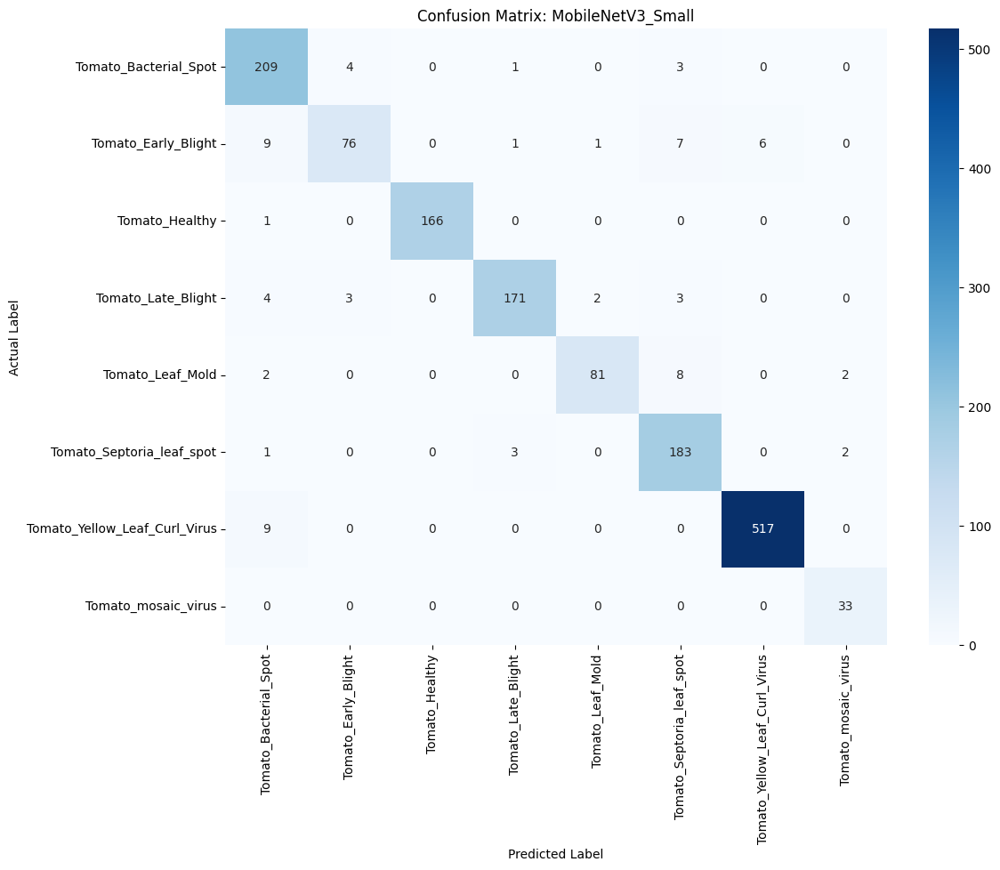

Evaluating MobileNetV2_Standard:   0%|          | 0/48 [00:00<?, ?it/s]


--- Detailed Classification Report for MobileNetV2_Standard ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.99      0.98      0.98       217
          Tomato_Early_Blight       0.99      0.93      0.96       100
               Tomato_Healthy       0.99      0.99      0.99       167
           Tomato_Late_Blight       0.96      0.99      0.97       183
             Tomato_Leaf_Mold       1.00      1.00      1.00        93
    Tomato_Septoria_leaf_spot       1.00      0.99      1.00       189
Tomato_Yellow_Leaf_Curl_Virus       1.00      1.00      1.00       526
          Tomato_mosaic_virus       1.00      1.00      1.00        33

                     accuracy                           0.99      1508
                    macro avg       0.99      0.99      0.99      1508
                 weighted avg       0.99      0.99      0.99      1508



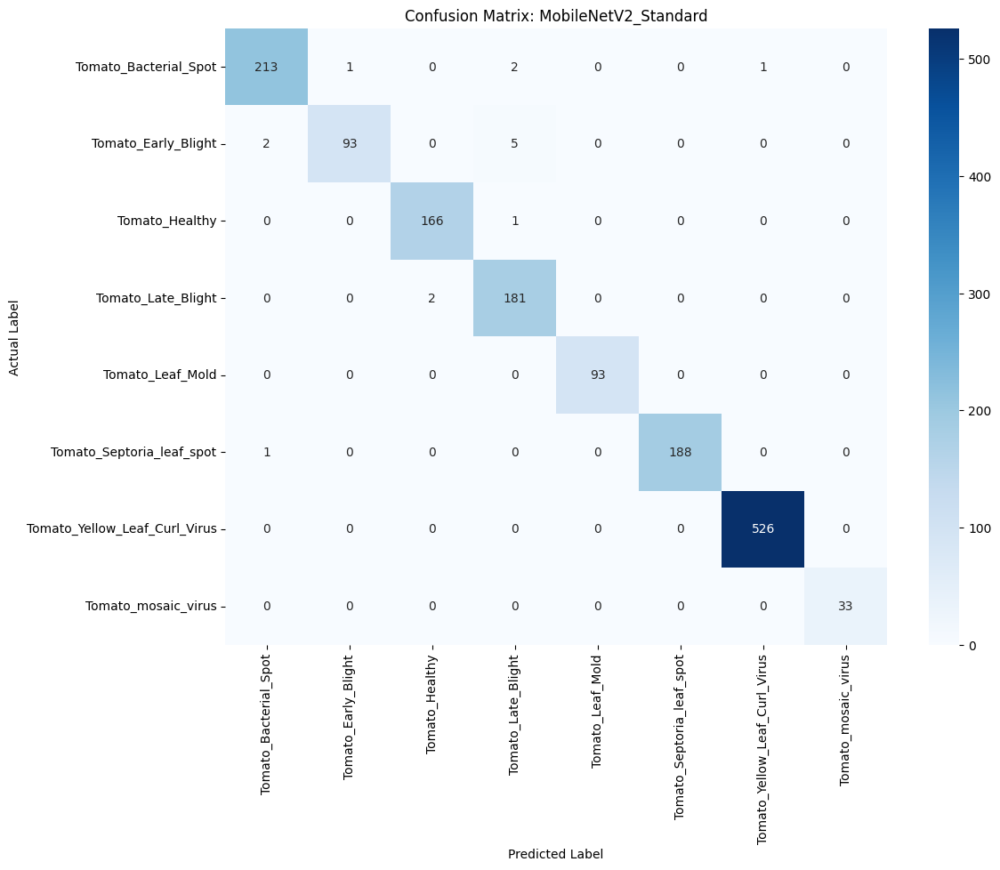

Evaluating MobileNetV2_Attentive:   0%|          | 0/48 [00:00<?, ?it/s]


--- Detailed Classification Report for MobileNetV2_Attentive ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.99      1.00      0.99       217
          Tomato_Early_Blight       0.99      0.95      0.97       100
               Tomato_Healthy       0.99      1.00      1.00       167
           Tomato_Late_Blight       0.98      0.99      0.99       183
             Tomato_Leaf_Mold       0.99      0.96      0.97        93
    Tomato_Septoria_leaf_spot       0.98      0.99      0.99       189
Tomato_Yellow_Leaf_Curl_Virus       1.00      1.00      1.00       526
          Tomato_mosaic_virus       1.00      1.00      1.00        33

                     accuracy                           0.99      1508
                    macro avg       0.99      0.99      0.99      1508
                 weighted avg       0.99      0.99      0.99      1508



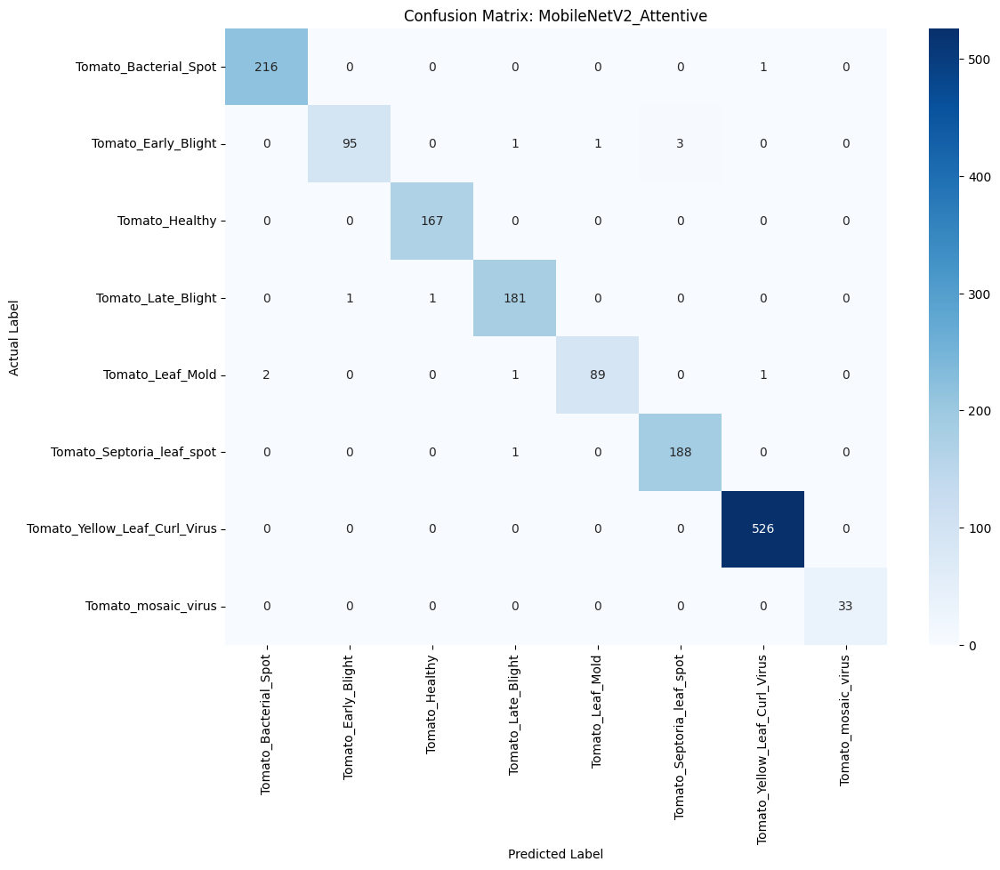


FINAL COMPARATIVE ANALYSIS


,Model,Accuracy,Precision,Recall,F1-Score
0,MobileNetV3_Small,0.952255,0.953567,0.952255,0.951788
1,MobileNetV2_Standard,0.990053,0.990179,0.990053,0.990022
2,MobileNetV2_Attentive,0.991379,0.991376,0.991379,0.991328


In [ ]:
# --- EXECUTION ---

# 1. Define models (ensure names match the saved .pth files)
eval_models = [
    ("MobileNetV3_Small", timm.create_model('mobilenetv3_small_100', num_classes=num_classes)),
    ("MobileNetV2_Standard", timm.create_model('mobilenetv2_100', num_classes=num_classes)),
    ("MobileNetV2_Attentive", AttentiveMobileNetV2(num_classes=num_classes))
]

# 2. Initialize and Run POO Evaluator
evaluator = ModelEvaluator(
    models_to_evaluate=eval_models,
    test_loader=test_loader,
    device=DEVICE,
    class_names=manager.classes,
    save_path=MODEL_SAVE_PATH
)

evaluator.load_weights()
evaluator.run_evaluation()
comparison_df = evaluator.display_summary_table()

=========================================================

In [ ]:
# Classe Grad-CAM et visualisation
class GradCAMVisualizer:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Hooks to capture gradients and feature maps
        self.target_layer.register_forward_hook(self.save_activations)
        self.target_layer.register_backward_hook(self.save_gradients)

    def save_activations(self, module, input, output):
        self.activations = output

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate_heatmap(self, input_image, target_class):
        self.model.zero_grad()
        output = self.model(input_image)

        # Backward pass
        loss = output[0, target_class]
        loss.backward()

        if self.gradients is None or self.activations is None:
            return np.zeros((224, 224)) # Return empty if hook failed

        # Global-average pooling of gradients
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)

        # Weighted combination of forward activation maps
        # [0] selects the first batch element
        cam = torch.sum(weights * self.activations, dim=1)[0]

        # ReLU and Normalization
        cam = np.maximum(cam.detach().cpu().numpy(), 0)

        # Safety check: avoid division by zero if heatmap is empty
        denom = cam.max() - cam.min()
        if denom == 0: return np.zeros((224, 224))

        cam = (cam - cam.min()) / (denom + 1e-8)
        cam = cv2.resize(cam, (224, 224))
        return cam
def visualize_results(model, dataset, class_names, num_samples=5):
    model.eval()

    # --- DYNAMIC LAYER DETECTION (THE FIX) ---
    if hasattr(model, 'backbone'):
        # For your Attentive MobileNetV2
        target_layer = model.backbone.conv_head
    elif hasattr(model, 'blocks'):
        # For timm MobileNetV3 (penultimate block is best for visualization)
        target_layer = model.blocks[-2]
    elif hasattr(model, 'conv_head'):
        # For standard timm MobileNetV2
        target_layer = model.conv_head
    elif hasattr(model, 'features'):
        # For torchvision models
        target_layer = model.features[-2]
    else:
        raise AttributeError("Target layer path unknown for this architecture.")

    cam = GradCAMVisualizer(model, target_layer)
    plt.figure(figsize=(15, num_samples * 4))

    for i in range(num_samples):
        idx = random.randint(0, len(dataset)-1)
        img_tensor, label = dataset[idx]
        input_tensor = img_tensor.unsqueeze(0).to(DEVICE)

        # Inference (with no_grad only for prediction, generate_heatmap needs grads)
        with torch.no_grad():
            preds = model(input_tensor)
            pred = preds.argmax(dim=1).item()

        # Generate Heatmap (this function handles its own grads)
        heatmap = cam.generate_heatmap(input_tensor, pred)

        # Prepare Original Image
        img_show = img_tensor.permute(1, 2, 0).cpu().numpy()
        img_show = img_show * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img_show = np.clip(img_show, 0, 1)

        # Overlay Logic
        heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB) / 255.0
        overlay = 0.6 * img_show + 0.4 * heatmap_color

        # Display
        plt.subplot(num_samples, 3, i*3 + 1)
        plt.imshow(img_show); plt.title(f"Actual: {class_names[label]}"); plt.axis('off')

        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(heatmap, cmap='jet'); plt.title("Attention Heatmap"); plt.axis('off')

        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(overlay); plt.title(f"Pred: {class_names[pred]}"); plt.axis('off')

    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1866: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


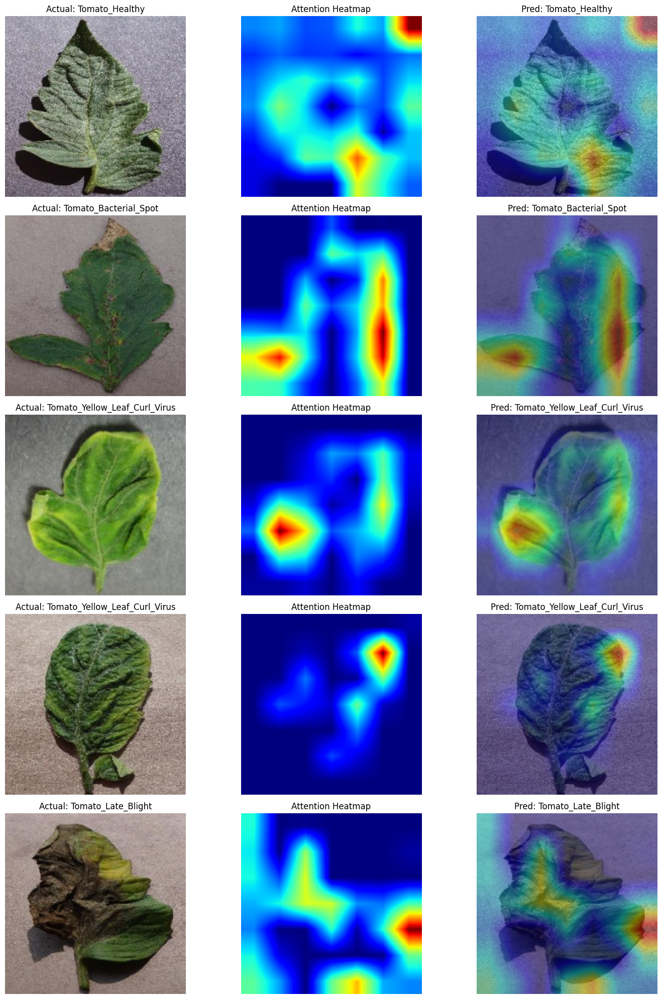

In [ ]:
# 1. MobileNetV3 Small
visualize_results(eval_models[0][1], manager.test_ds, manager.classes)

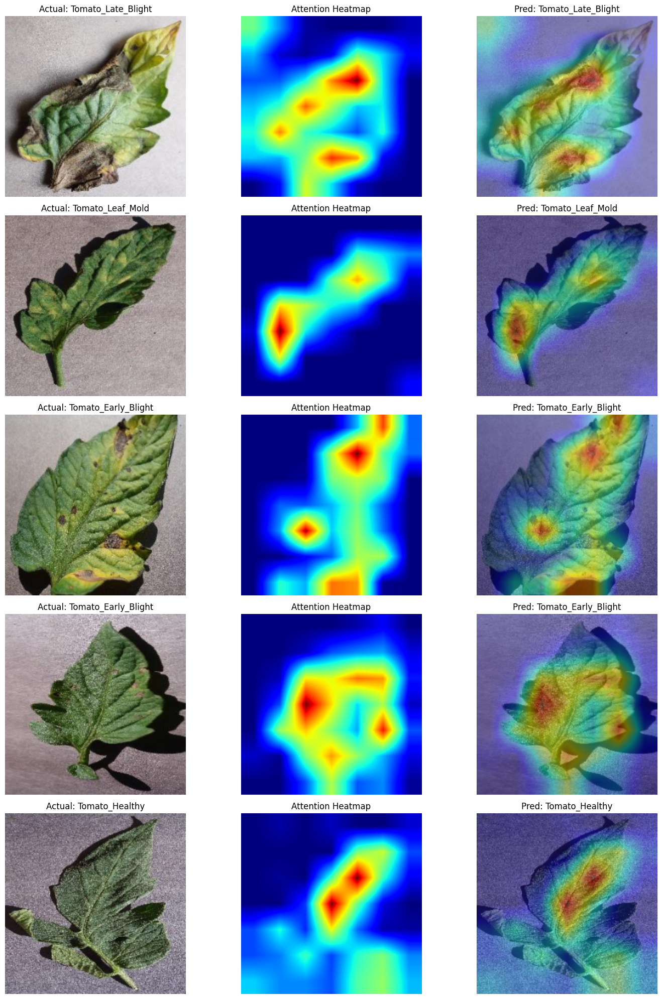

In [ ]:
# 2. MobileNetV2 Standard
visualize_results(eval_models[1][1], manager.test_ds, manager.classes)

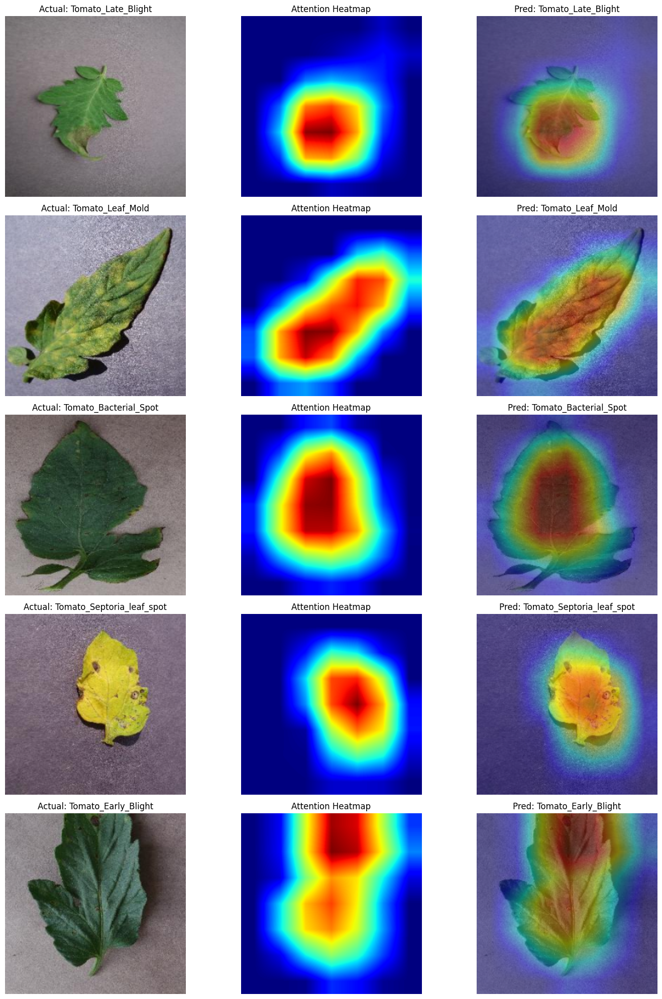

In [ ]:
# 3. MobileNetV2 Attentive
visualize_results(eval_models[2][1], manager.test_ds, manager.classes)

===========================================

Starting Evaluation on External Dataset...
Successfully loaded weights for MobileNetV3_Small
Successfully loaded weights for MobileNetV2_Standard
Successfully loaded weights for MobileNetV2_Attentive


Evaluating MobileNetV3_Small:   0%|          | 0/3 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m


--- Detailed Classification Report for MobileNetV3_Small ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.00      0.00      0.00         9
          Tomato_Early_Blight       0.21      0.89      0.33         9
               Tomato_Healthy       0.00      0.00      0.00         8
           Tomato_Late_Blight       0.42      0.50      0.45        10
             Tomato_Leaf_Mold       0.33      0.17      0.22         6
    Tomato_Septoria_leaf_spot       0.33      0.36      0.35        11
Tomato_Yellow_Leaf_Curl_Virus       0.00      0.00      0.00         6
          Tomato_mosaic_virus       0.33      0.10      0.15        10

                     accuracy                           0.28        69
                    macro avg       0.20      0.25      0.19        69
                 weighted avg       0.22      0.28      0.21        69



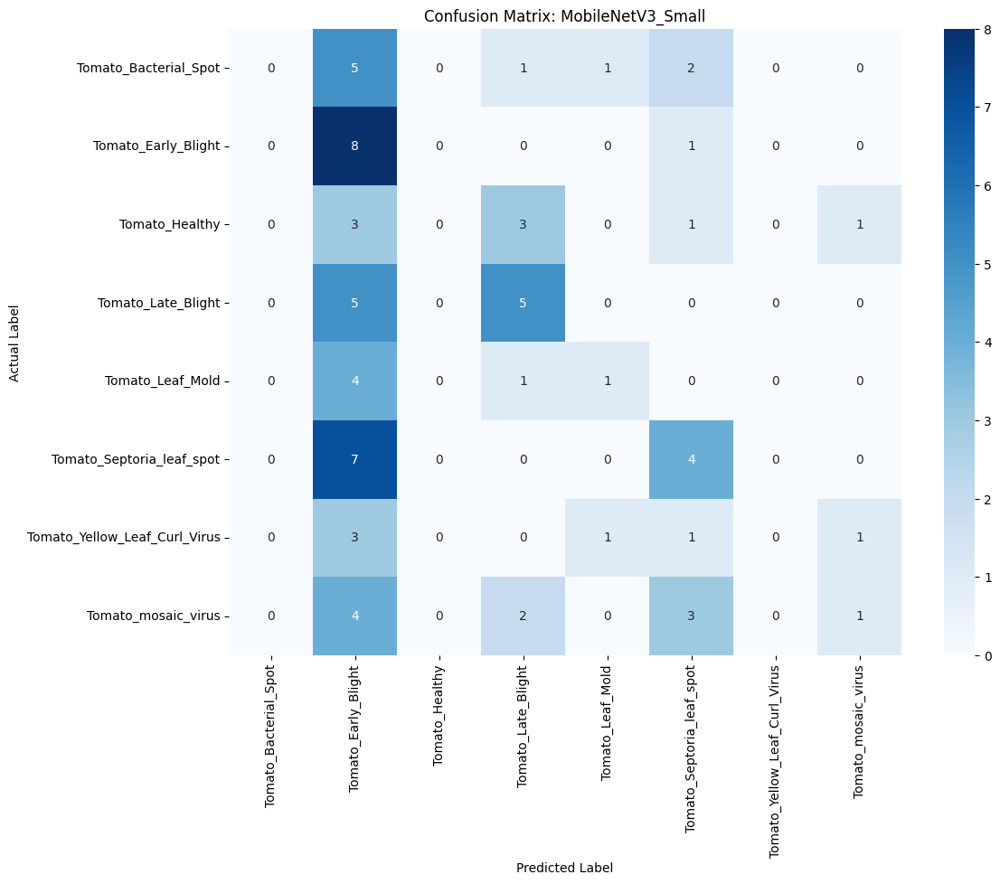

Evaluating MobileNetV2_Standard:   0%|          | 0/3 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m


--- Detailed Classification Report for MobileNetV2_Standard ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.00      0.00      0.00         9
          Tomato_Early_Blight       0.25      0.56      0.34         9
               Tomato_Healthy       0.00      0.00      0.00         8
           Tomato_Late_Blight       0.24      0.90      0.38        10
             Tomato_Leaf_Mold       1.00      0.17      0.29         6
    Tomato_Septoria_leaf_spot       0.44      0.36      0.40        11
Tomato_Yellow_Leaf_Curl_Virus       0.00      0.00      0.00         6
          Tomato_mosaic_virus       0.00      0.00      0.00        10

                     accuracy                           0.28        69
                    macro avg       0.24      0.25      0.18        69
                 weighted avg       0.22      0.28      0.19        69



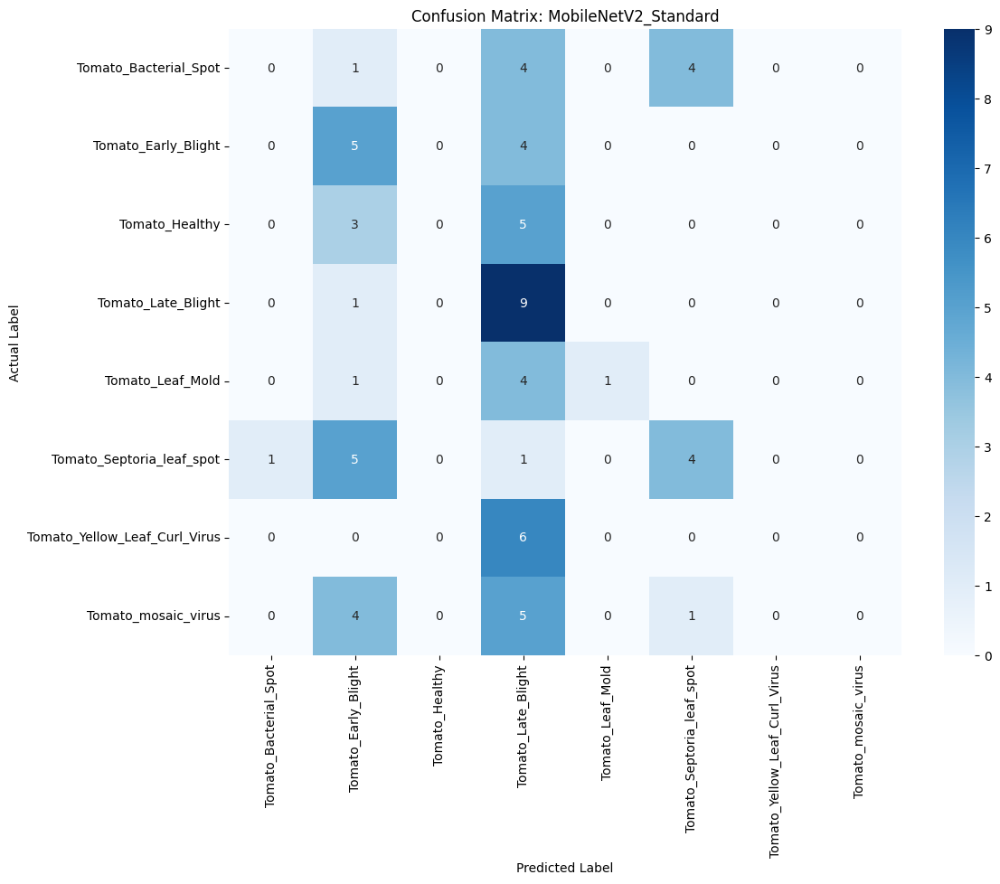

Evaluating MobileNetV2_Attentive:   0%|          | 0/3 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m


--- Detailed Classification Report for MobileNetV2_Attentive ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.00      0.00      0.00         9
          Tomato_Early_Blight       0.20      1.00      0.33         9
               Tomato_Healthy       0.00      0.00      0.00         8
           Tomato_Late_Blight       0.42      0.50      0.45        10
             Tomato_Leaf_Mold       0.00      0.00      0.00         6
    Tomato_Septoria_leaf_spot       0.43      0.27      0.33        11
Tomato_Yellow_Leaf_Curl_Virus       1.00      0.33      0.50         6
          Tomato_mosaic_virus       0.00      0.00      0.00        10

                     accuracy                           0.28        69
                    macro avg       0.26      0.26      0.20        69
                 weighted avg       0.24      0.28      0.21        69



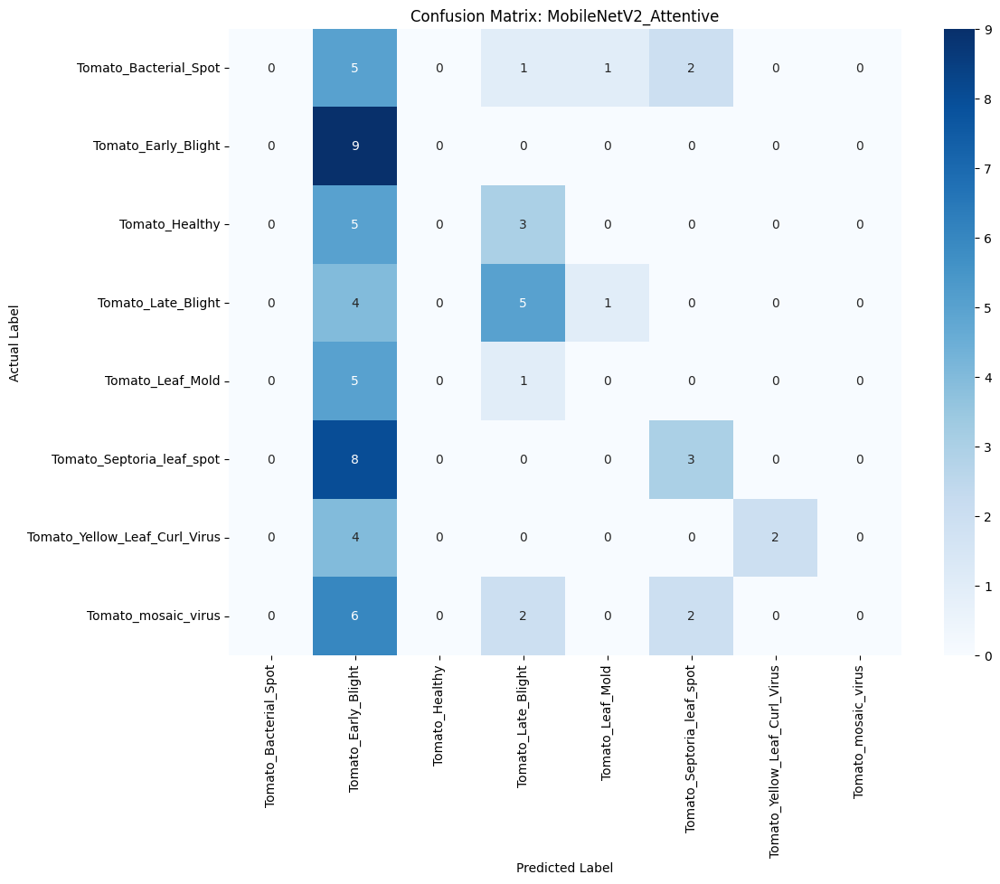


FINAL COMPARATIVE ANALYSIS


,Model,Accuracy,Precision,Recall,F1-Score
0,MobileNetV3_Small,0.275362,0.217577,0.275362,0.206425
1,MobileNetV2_Standard,0.275362,0.224744,0.275362,0.187938
2,MobileNetV2_Attentive,0.275362,0.241186,0.275362,0.205182


In [ ]:
# --- 1. CONFIGURATION FOR EXTERNAL TEST ---
EXTERNAL_TEST_PATH = "/content/PlantDoc_Tomato/test" # Update this to your new dataset path

# --- 2. PREPARE EXTERNAL DATALOADER ---
# We use the Val/Test augmentation (Resize + Normalize) without background injection
external_transform = AugmentationFactory.get_val_aug()

# Load the external directory
external_raw = datasets.ImageFolder(EXTERNAL_TEST_PATH)
external_ds = PlantDataset(Subset(external_raw, range(len(external_raw))), external_transform)

external_loader = DataLoader(external_ds, batch_size=Config.BATCH_SIZE, shuffle=False, num_workers=2)

# --- 3. EXECUTE EVALUATION ---
# Using the same POO Evaluator class we built earlier
external_evaluator = ModelEvaluator(
    models_to_evaluate=eval_models, # These are your 3 trained models
    test_loader=external_loader,
    device=DEVICE,
    class_names=manager.classes,
    save_path=MODEL_SAVE_PATH
)

print("Starting Evaluation on External Dataset...")
external_evaluator.load_weights()
external_evaluator.run_evaluation()
external_results_df = external_evaluator.display_summary_table()

# Save these specific external results
external_results_df.to_csv(os.path.join(MODEL_SAVE_PATH, "external_test_results.csv"), index=False)

Starting Evaluation on External Dataset...
Successfully loaded weights for MobileNetV3_Small
Successfully loaded weights for MobileNetV2_Standard
Successfully loaded weights for MobileNetV2_Attentive


Evaluating MobileNetV3_Small:   0%|          | 0/48 [00:00<?, ?it/s]


--- Detailed Classification Report for MobileNetV3_Small ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.90      0.95      0.93       217
          Tomato_Early_Blight       0.91      0.77      0.83       100
               Tomato_Healthy       1.00      1.00      1.00       167
           Tomato_Late_Blight       0.96      0.95      0.95       183
             Tomato_Leaf_Mold       0.98      0.88      0.93        93
    Tomato_Septoria_leaf_spot       0.91      0.94      0.93       189
Tomato_Yellow_Leaf_Curl_Virus       0.99      0.99      0.99       526
          Tomato_mosaic_virus       0.85      1.00      0.92        33

                     accuracy                           0.95      1508
                    macro avg       0.94      0.94      0.93      1508
                 weighted avg       0.95      0.95      0.95      1508



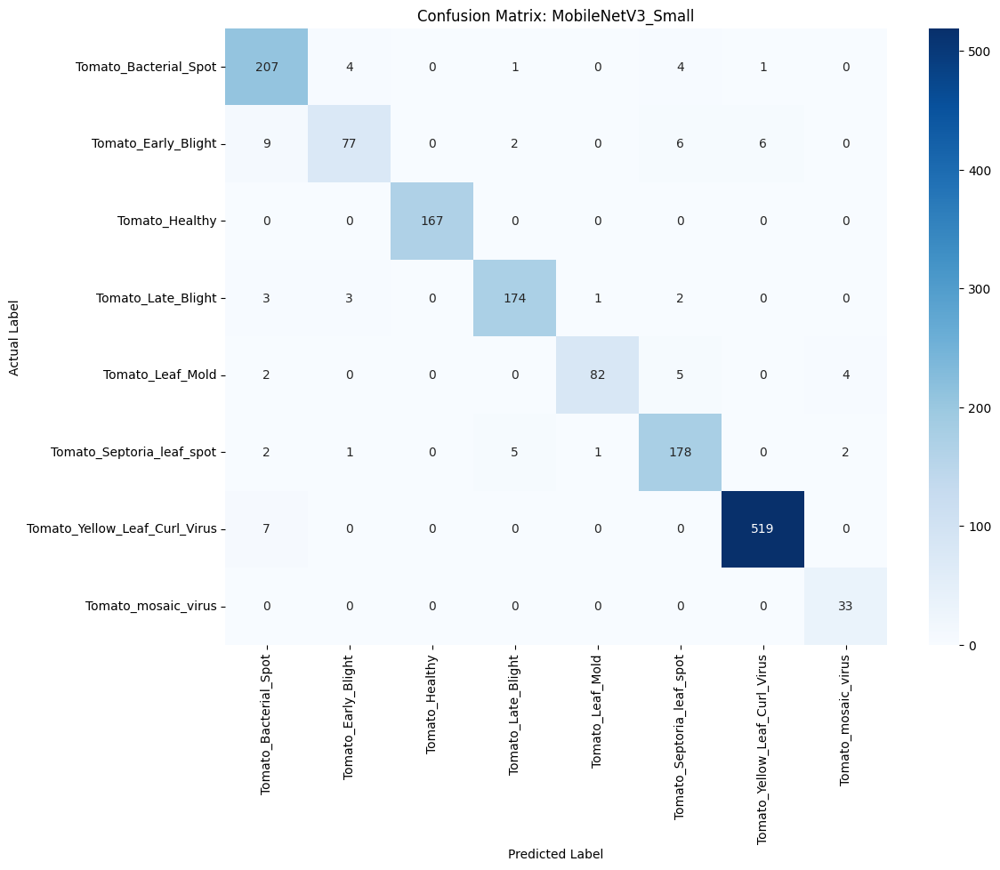

Evaluating MobileNetV2_Standard:   0%|          | 0/48 [00:00<?, ?it/s]


--- Detailed Classification Report for MobileNetV2_Standard ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.98      0.98      0.98       217
          Tomato_Early_Blight       0.97      0.92      0.94       100
               Tomato_Healthy       0.99      0.99      0.99       167
           Tomato_Late_Blight       0.93      0.98      0.95       183
             Tomato_Leaf_Mold       0.98      0.99      0.98        93
    Tomato_Septoria_leaf_spot       1.00      0.95      0.97       189
Tomato_Yellow_Leaf_Curl_Virus       1.00      1.00      1.00       526
          Tomato_mosaic_virus       1.00      1.00      1.00        33

                     accuracy                           0.98      1508
                    macro avg       0.98      0.98      0.98      1508
                 weighted avg       0.98      0.98      0.98      1508



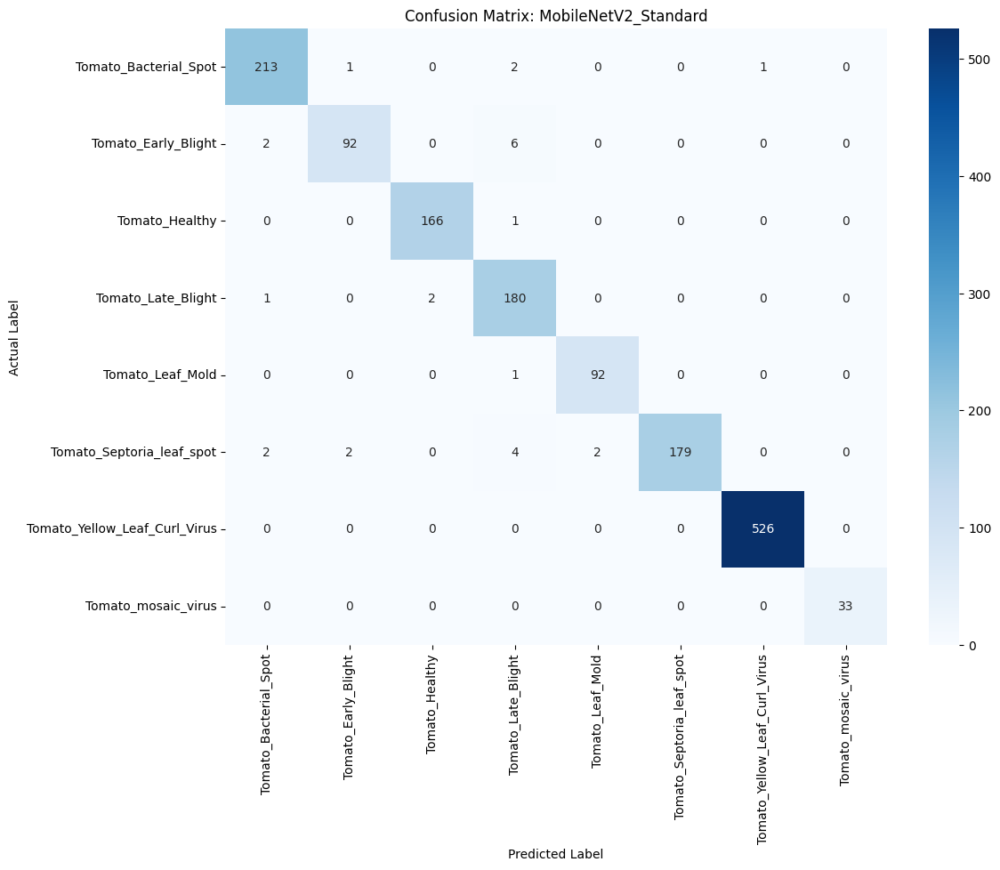

Evaluating MobileNetV2_Attentive:   0%|          | 0/48 [00:00<?, ?it/s]


--- Detailed Classification Report for MobileNetV2_Attentive ---
                               precision    recall  f1-score   support

        Tomato_Bacterial_Spot       0.99      1.00      0.99       217
          Tomato_Early_Blight       0.99      0.96      0.97       100
               Tomato_Healthy       0.99      1.00      1.00       167
           Tomato_Late_Blight       0.98      0.99      0.99       183
             Tomato_Leaf_Mold       0.98      0.97      0.97        93
    Tomato_Septoria_leaf_spot       0.99      0.98      0.99       189
Tomato_Yellow_Leaf_Curl_Virus       1.00      1.00      1.00       526
          Tomato_mosaic_virus       1.00      1.00      1.00        33

                     accuracy                           0.99      1508
                    macro avg       0.99      0.99      0.99      1508
                 weighted avg       0.99      0.99      0.99      1508



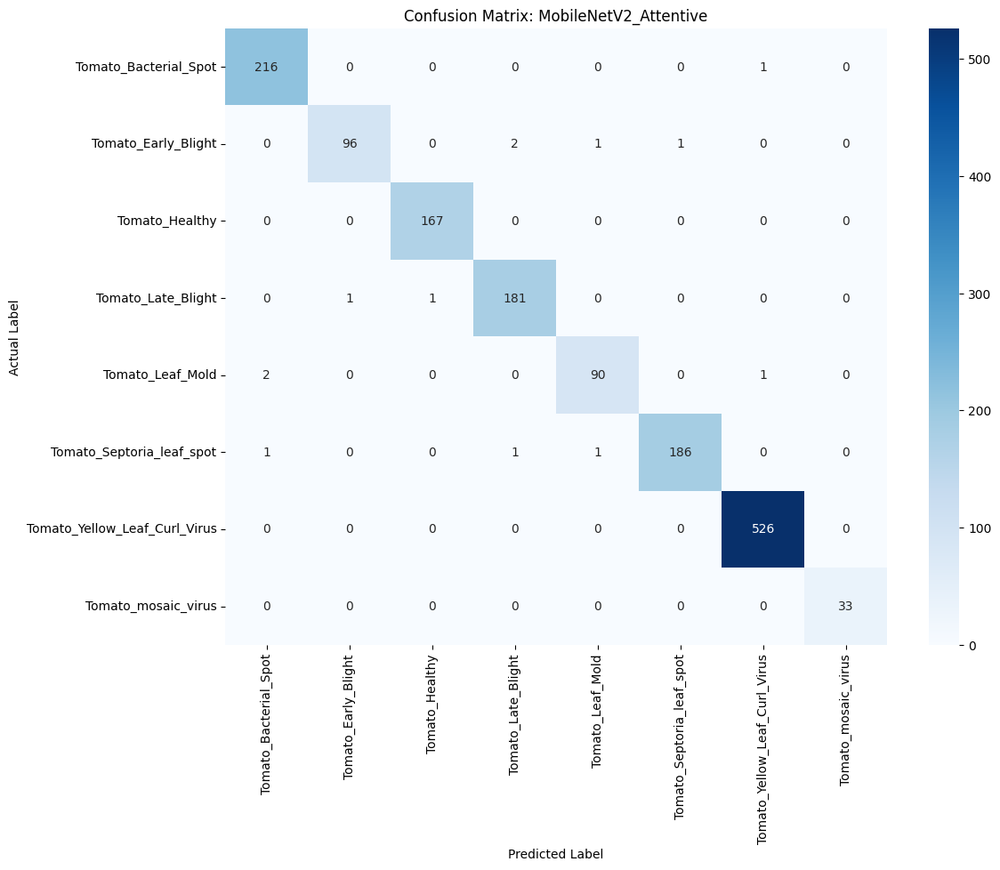


FINAL COMPARATIVE ANALYSIS


,Model,Accuracy,Precision,Recall,F1-Score
0,MobileNetV3_Small,0.952918,0.953631,0.952918,0.952479
1,MobileNetV2_Standard,0.982095,0.982556,0.982095,0.982092
2,MobileNetV2_Attentive,0.991379,0.991375,0.991379,0.991351


In [ ]:
# --- 1. CONFIGURATION FOR EXTERNAL TEST ---
EXTERNAL_TEST_PATH = "/content/test_dataset_final" # Update this to your new dataset path

# --- 2. PREPARE EXTERNAL DATALOADER ---
# We use the Val/Test augmentation (Resize + Normalize) without background injection
external_transform = AugmentationFactory.get_val_aug()

# Load the external directory
external_raw = datasets.ImageFolder(EXTERNAL_TEST_PATH)
external_ds = PlantDataset(Subset(external_raw, range(len(external_raw))), external_transform)

external_loader = DataLoader(external_ds, batch_size=Config.BATCH_SIZE, shuffle=False, num_workers=2)

# --- 3. EXECUTE EVALUATION ---
# Using the same POO Evaluator class we built earlier
external_evaluator = ModelEvaluator(
    models_to_evaluate=eval_models, # These are your 3 trained models
    test_loader=external_loader,
    device=DEVICE,
    class_names=manager.classes,
    save_path=MODEL_SAVE_PATH
)

print("Starting Evaluation on External Dataset...")
external_evaluator.load_weights()
external_evaluator.run_evaluation()
external_results_df = external_evaluator.display_summary_table()

# Save these specific external results
external_results_df.to_csv(os.path.join(MODEL_SAVE_PATH, "external_test_results.csv"), index=False)